In [1]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import IPython.display as ipd
import random
import soundfile as sf
import seaborn as sns
import time

import helpers.utils as helpers
import helpers.calc_metrics as metrics
from make_network.system import get_model
from make_network.spsa_layer import apply_peq, apply_drc
import own_config as config

2024-03-31 19:20:14.142167: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
### how to:
### pick file_offset to choose next files
### choose no of plots to plot
### run the cells:
#### loading paths
#### preparing datasets (loading batches)
#### build model and load weights
#### calculate plots (single files)
#### calculate metrics distribution (all test files) and plot
#### timing test

file_offset = 0 ##to see next files
no_of_plots = 10 ### no of examples to plot
#batch_size = config.config['batch_size'] #for training
batch_size = 1
sample_rate = 24000
plots_saving_on = True
audio_saving_on = True

weights_path = './my_logs/run_2024_03_23_00_54_50/cp-0072.weights.h5' ### weights for small model

test_ref_dir = "./datasets/AEinBOX_test_dataset/clean"   #### ref = y; in = x
test_in_dir = "./datasets/AEinBOX_test_dataset/dirty"

test_in_filepaths = helpers.get_file_paths(test_in_dir)
test_ref_filepaths = helpers.get_file_paths(test_ref_dir)
test_in_filepaths = test_in_filepaths[file_offset:no_of_plots+file_offset]
test_ref_filepaths = test_ref_filepaths[file_offset:no_of_plots+file_offset]

# To apply the offset and select a specific number of plots from both input and reference file paths
#shifted_test_in_filepaths = test_in_filepaths[file_offset:no_of_plots + file_offset]
#shifted_test_ref_filepaths = test_ref_filepaths[file_offset:no_of_plots + file_offset]


print('Input files:')
print(test_in_filepaths[file_offset:no_of_plots+file_offset])

#print('Reference files:')
#print(test_ref_filepaths[file_offset:no_of_plots+file_offset])

Input files:
['./datasets/AEinBOX_test_dataset/dirty/1276168_warm_IR.wav', './datasets/AEinBOX_test_dataset/dirty/1352137_broadcast_IR.wav', './datasets/AEinBOX_test_dataset/dirty/1243725_broadcast_IR.wav', './datasets/AEinBOX_test_dataset/dirty/1335359_neutral_IR.wav', './datasets/AEinBOX_test_dataset/dirty/1265331_warm_IR.wav', './datasets/AEinBOX_test_dataset/dirty/1083302_bright_IR.wav', './datasets/AEinBOX_test_dataset/dirty/1413961_telephone_IR.wav', './datasets/AEinBOX_test_dataset/dirty/1137240_warm_IR.wav', './datasets/AEinBOX_test_dataset/dirty/1160273_bright_IR.wav', './datasets/AEinBOX_test_dataset/dirty/162582_warm_IR.wav']


In [3]:
# Prepare the test dataset
test_dataset,test_packed_filepaths = helpers.prepare_test_dataset(test_in_dir, test_ref_dir,batchsize=batch_size)

# Retrieve a single batch from the test dataset
for ((x_batch, y_batch), _) in test_dataset:
    # We exclude the batch dimension when inferring input shape
    input_shape = x_batch.shape[1:]
    break  # Only need the first batch to get the shape

print("Inferred input shape (excluding batch dimension):", input_shape)
#print(test_packed_filepaths[file_offset:file_offset+no_of_plots])

Inferred input shape (excluding batch dimension): (60000,)


In [4]:
# Load the model with the inferred input shape
model, analyzer_model = get_model(config.config, input_shape)
model.load_weights(weights_path)
print('Weights Loaded')

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_data_channel (InputL  [(None, 60000)]              0         []                            
 ayer)                                                                                            
                                                                                                  
 referenz_data_channel (Inp  [(None, 60000)]              0         []                            
 utLayer)                                                                                         
                                                                                                  
 MelLayer_in (MelSpectrogra  (None, 256, 256, 1)          0         ['input_data_channel[0][0]']  
 mLayer)                                                                                    

1/1 [==============================] - 1s 718ms/step
Audio File no. 1 of 10: Comparison Input, Prediction and Groundtruth


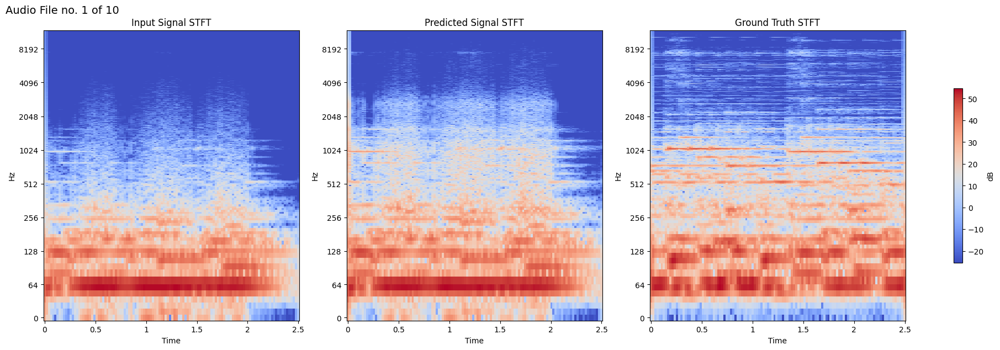

Audio File no. 1 of 10: Audio preview Input file, Prediction and Groundtruth


Audio File no. 1 of 10: Errormetrics and DSP Parameters


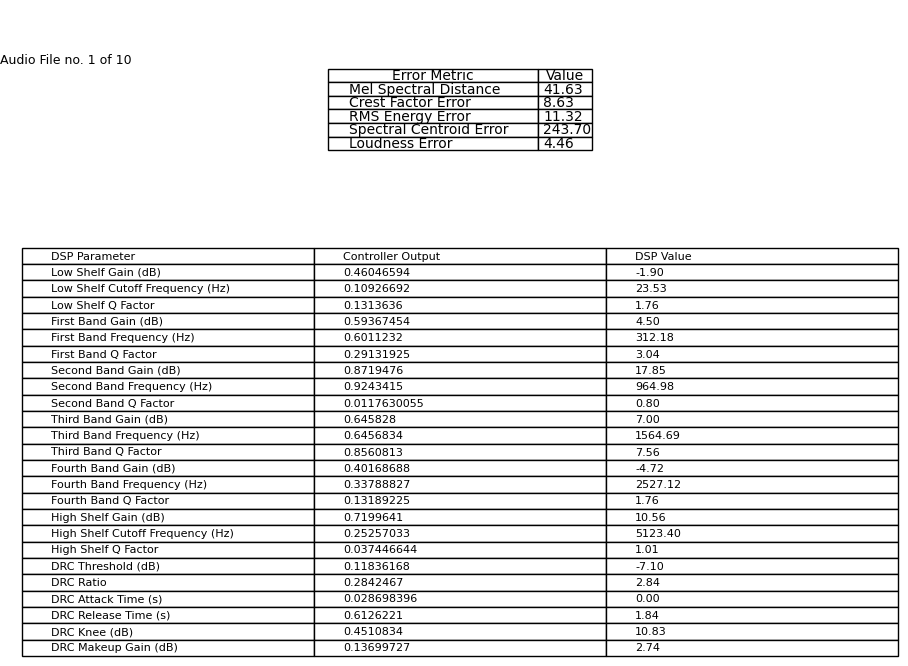

Audio File no. 1 of 10: Waveform and STFTs


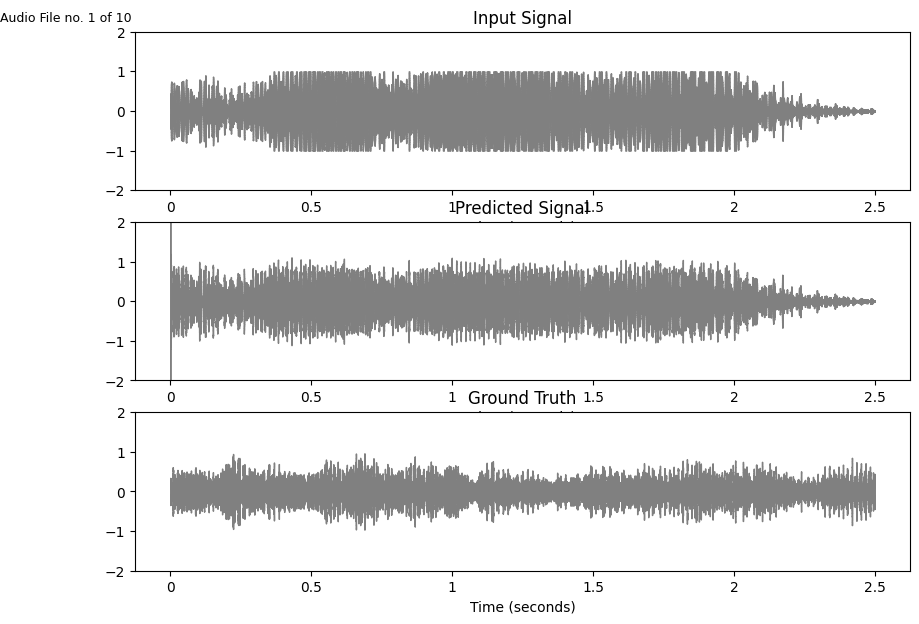

1/1 [==============================] - 0s 43ms/step
Audio File no. 2 of 10: Comparison Input, Prediction and Groundtruth


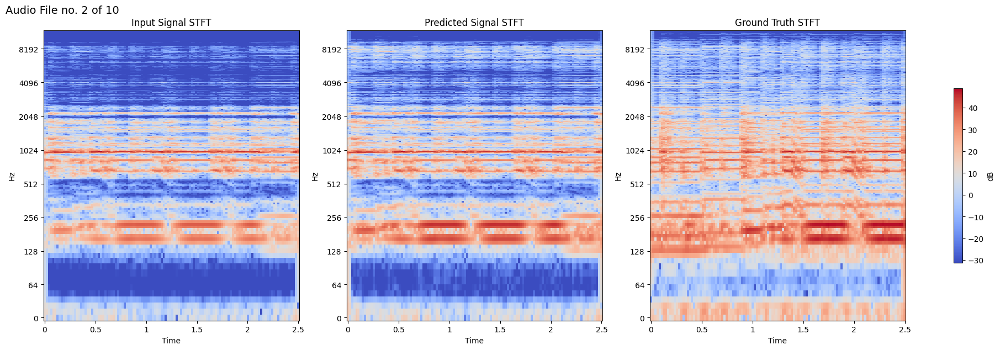

Audio File no. 2 of 10: Audio preview Input file, Prediction and Groundtruth


Audio File no. 2 of 10: Errormetrics and DSP Parameters


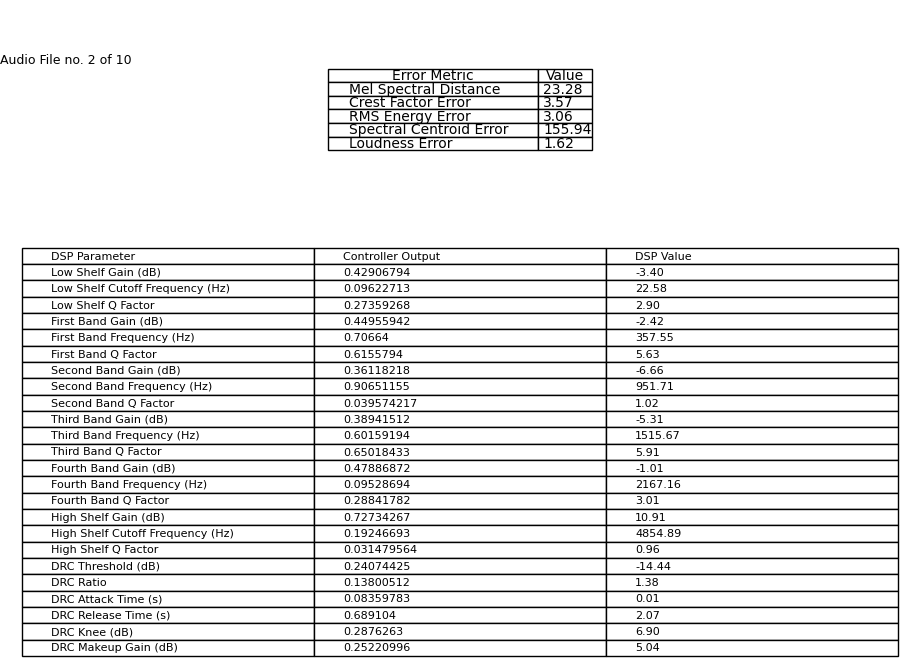

Audio File no. 2 of 10: Waveform and STFTs


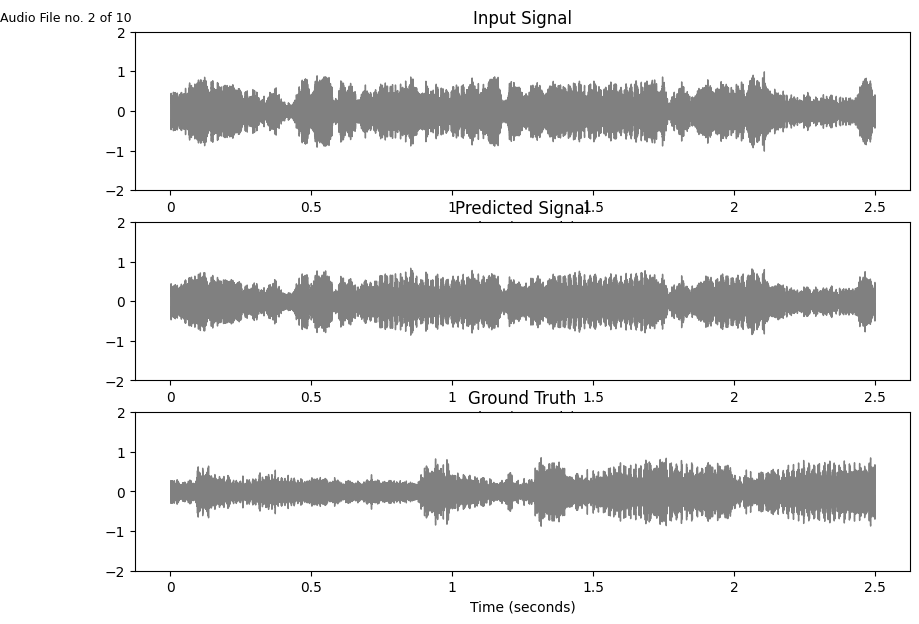

1/1 [==============================] - 0s 43ms/step
Audio File no. 3 of 10: Comparison Input, Prediction and Groundtruth


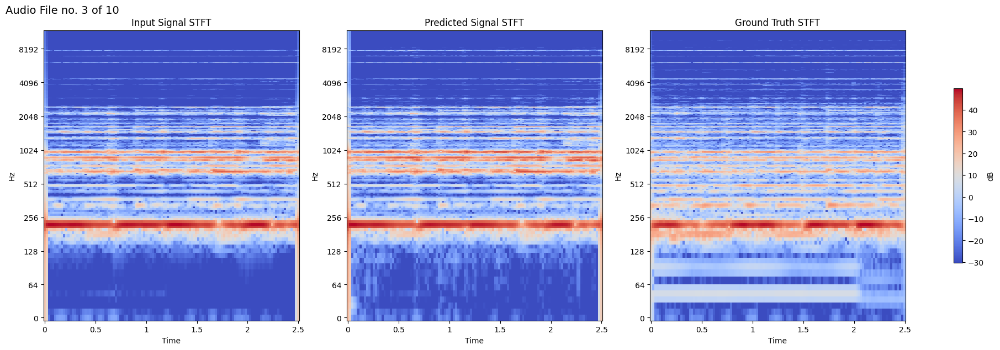

Audio File no. 3 of 10: Audio preview Input file, Prediction and Groundtruth


Audio File no. 3 of 10: Errormetrics and DSP Parameters


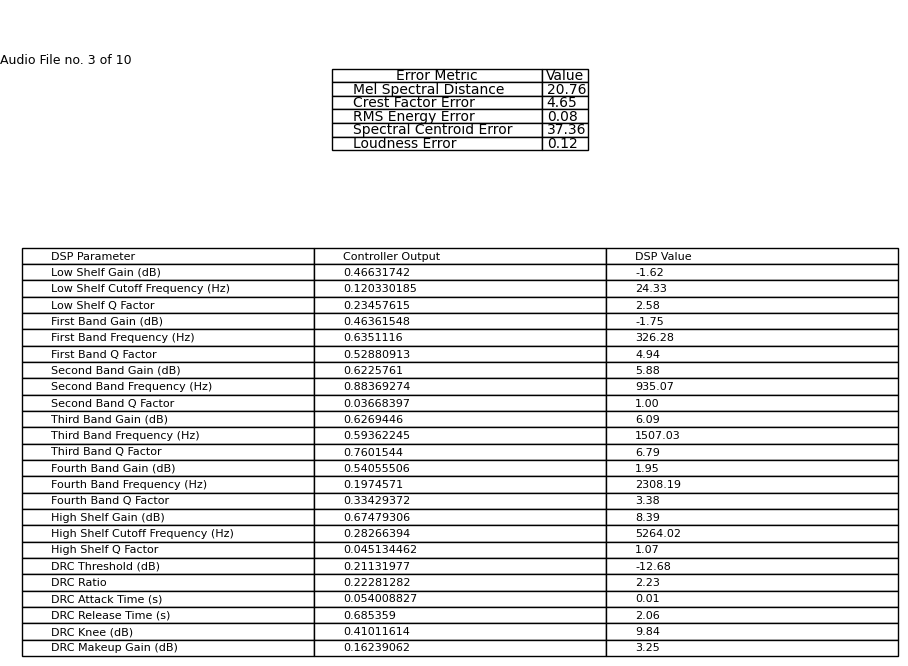

Audio File no. 3 of 10: Waveform and STFTs


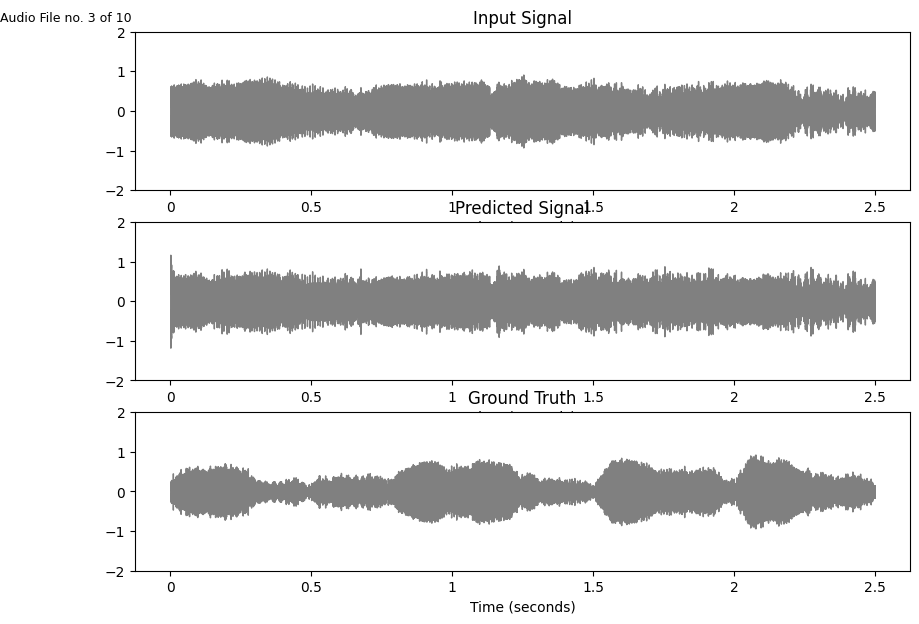

1/1 [==============================] - 0s 39ms/step
Audio File no. 4 of 10: Comparison Input, Prediction and Groundtruth


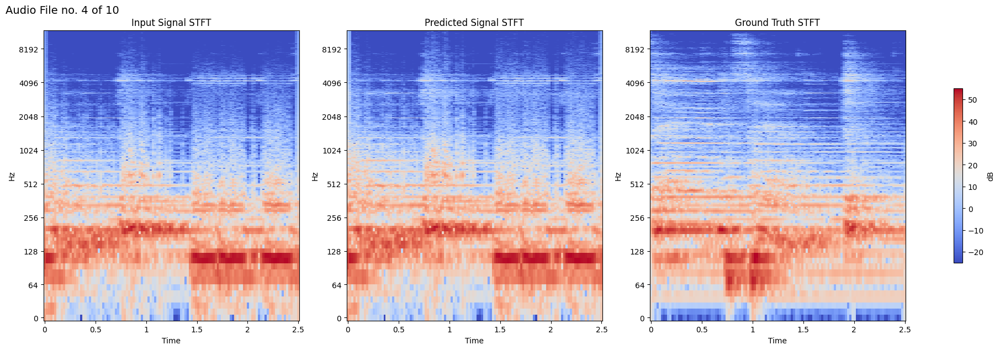

Audio File no. 4 of 10: Audio preview Input file, Prediction and Groundtruth


Audio File no. 4 of 10: Errormetrics and DSP Parameters


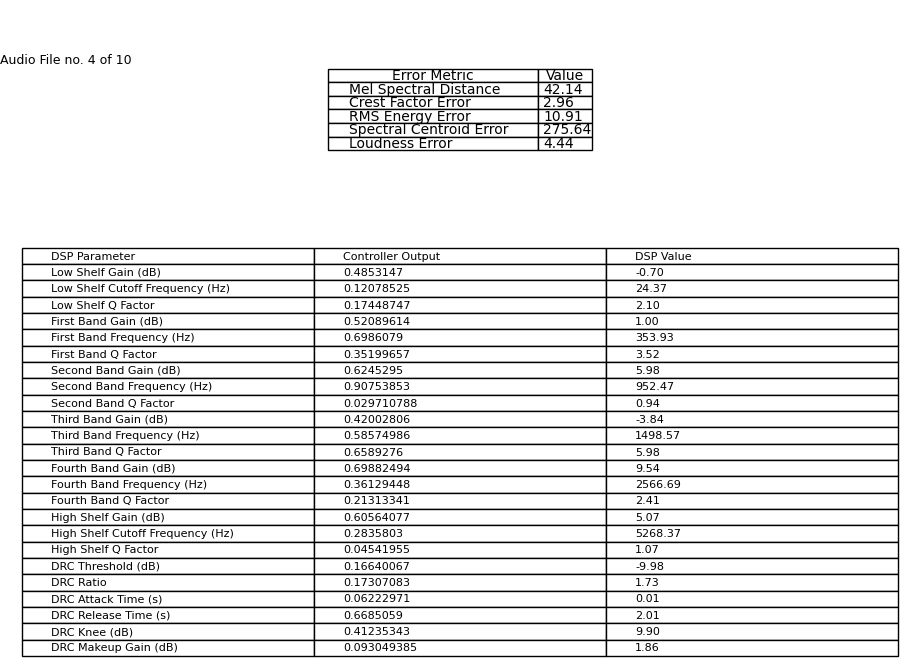

Audio File no. 4 of 10: Waveform and STFTs


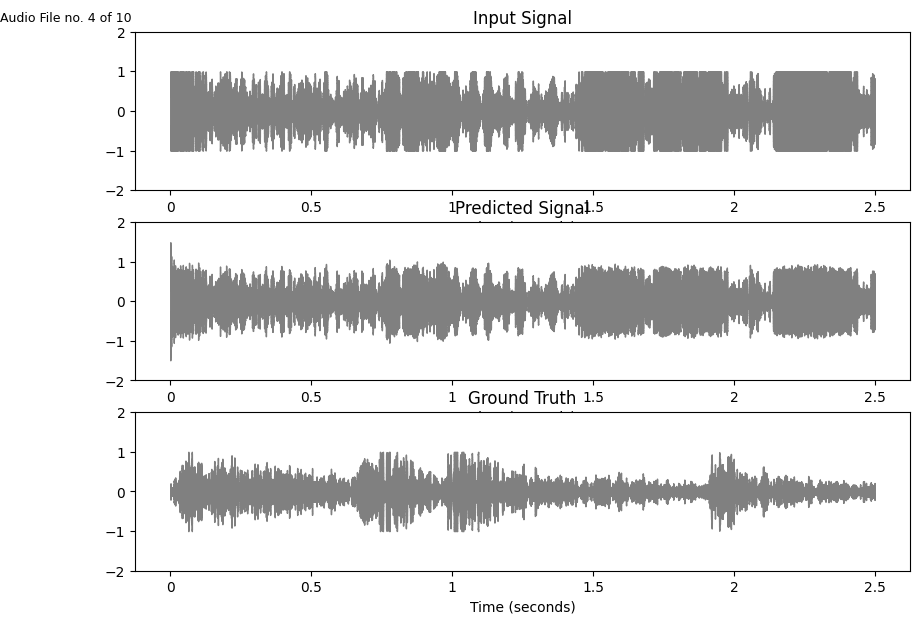

1/1 [==============================] - 0s 37ms/step
Audio File no. 5 of 10: Comparison Input, Prediction and Groundtruth


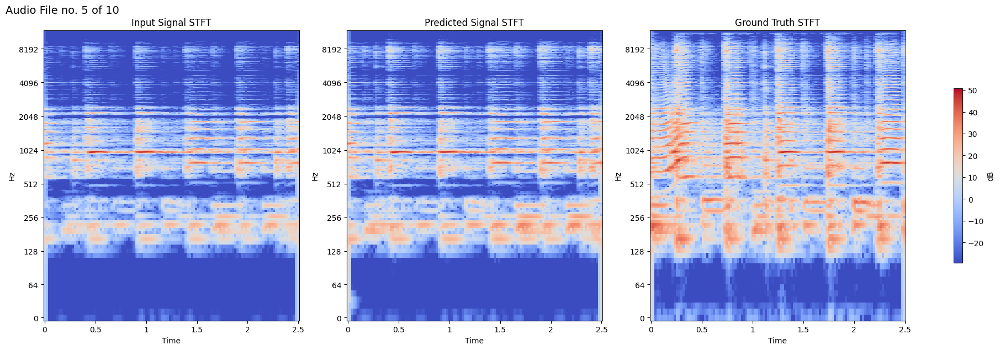

Audio File no. 5 of 10: Audio preview Input file, Prediction and Groundtruth


Audio File no. 5 of 10: Errormetrics and DSP Parameters


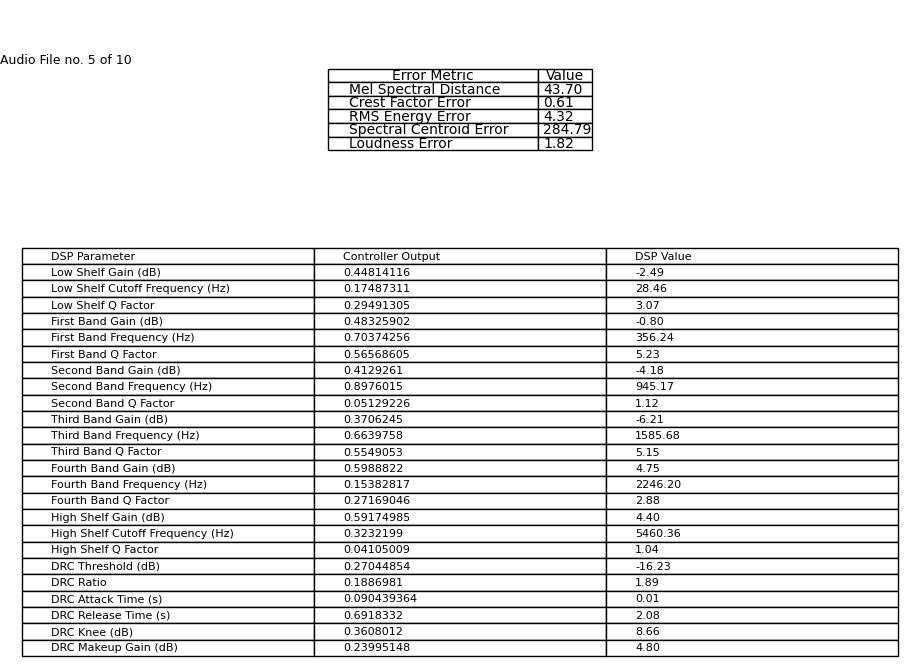

Audio File no. 5 of 10: Waveform and STFTs


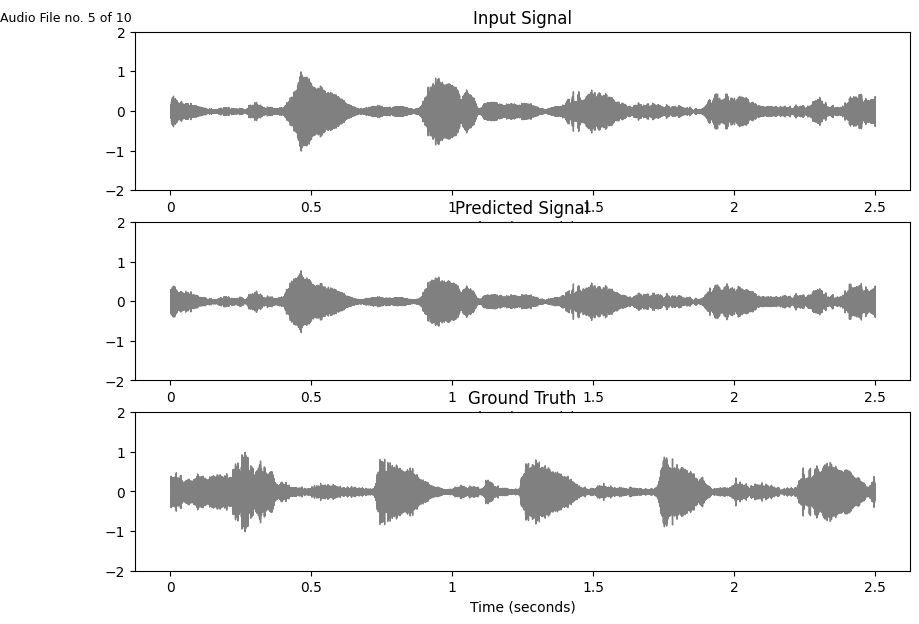

1/1 [==============================] - 0s 34ms/step
Audio File no. 6 of 10: Comparison Input, Prediction and Groundtruth


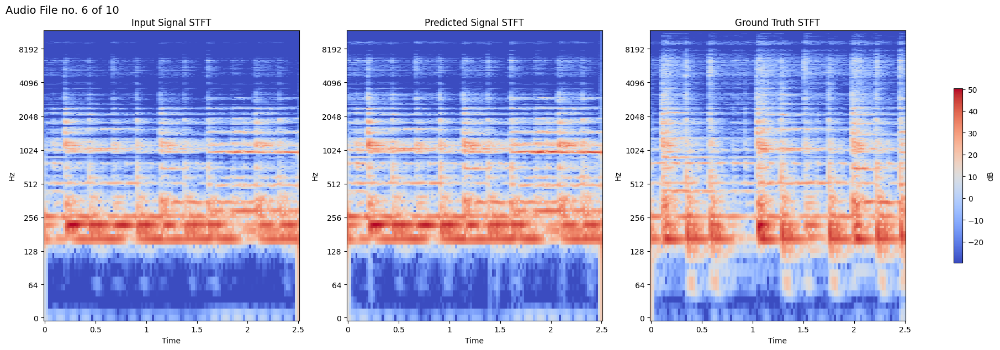

Audio File no. 6 of 10: Audio preview Input file, Prediction and Groundtruth


Audio File no. 6 of 10: Errormetrics and DSP Parameters


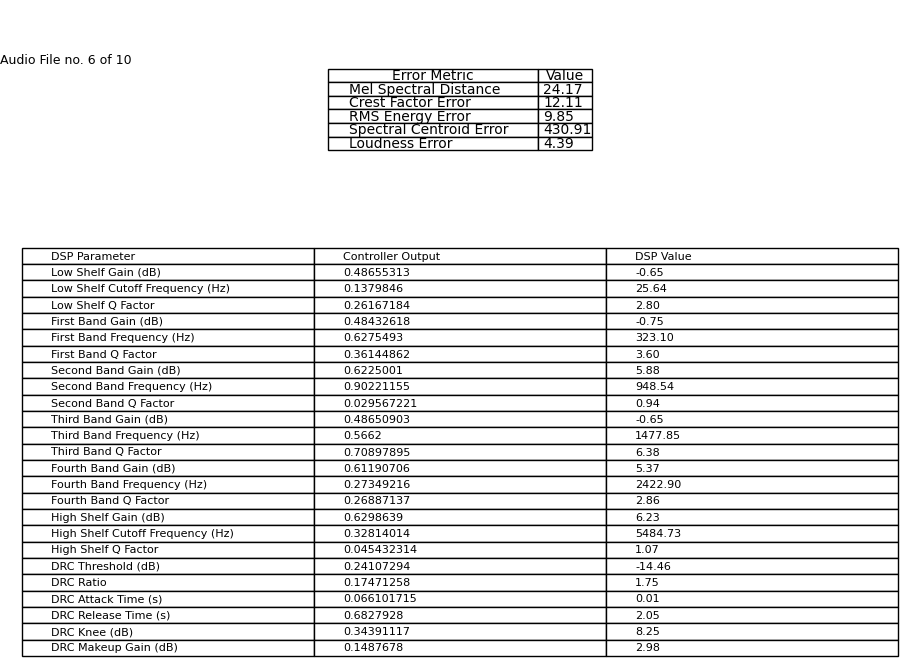

Audio File no. 6 of 10: Waveform and STFTs


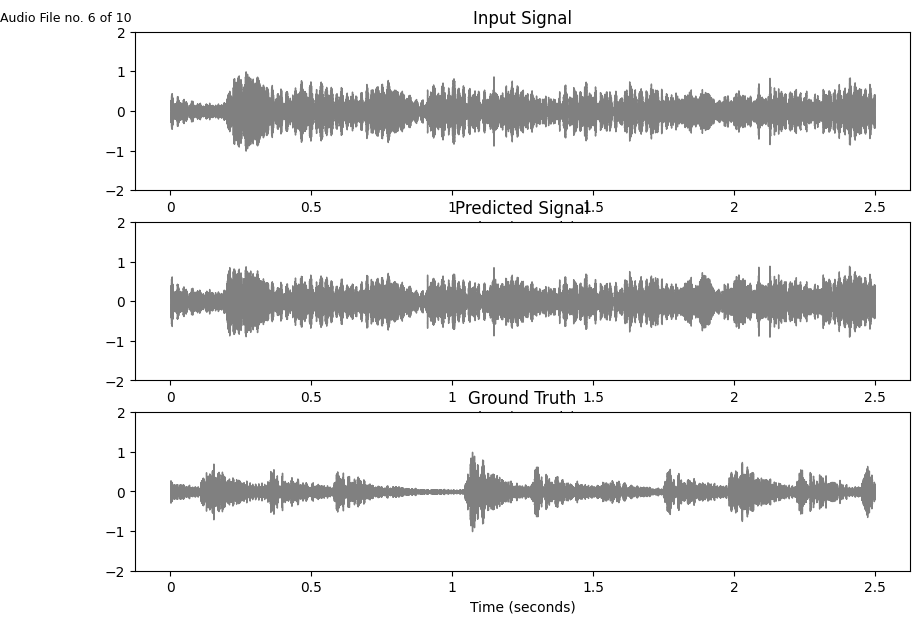

1/1 [==============================] - 0s 37ms/step
Audio File no. 7 of 10: Comparison Input, Prediction and Groundtruth


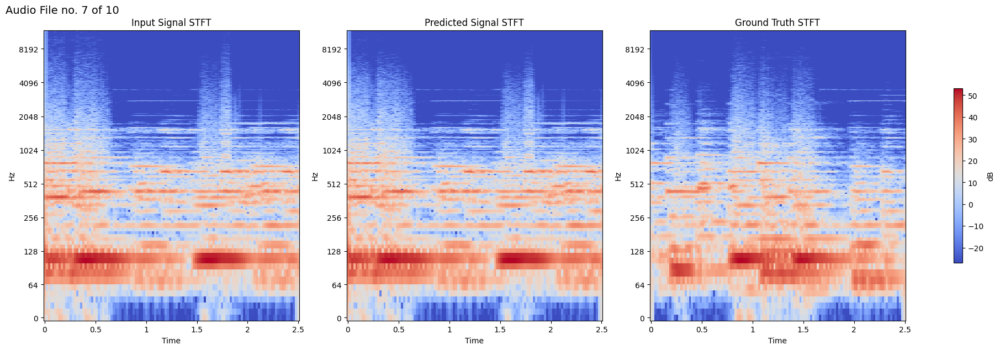

Audio File no. 7 of 10: Audio preview Input file, Prediction and Groundtruth


Audio File no. 7 of 10: Errormetrics and DSP Parameters


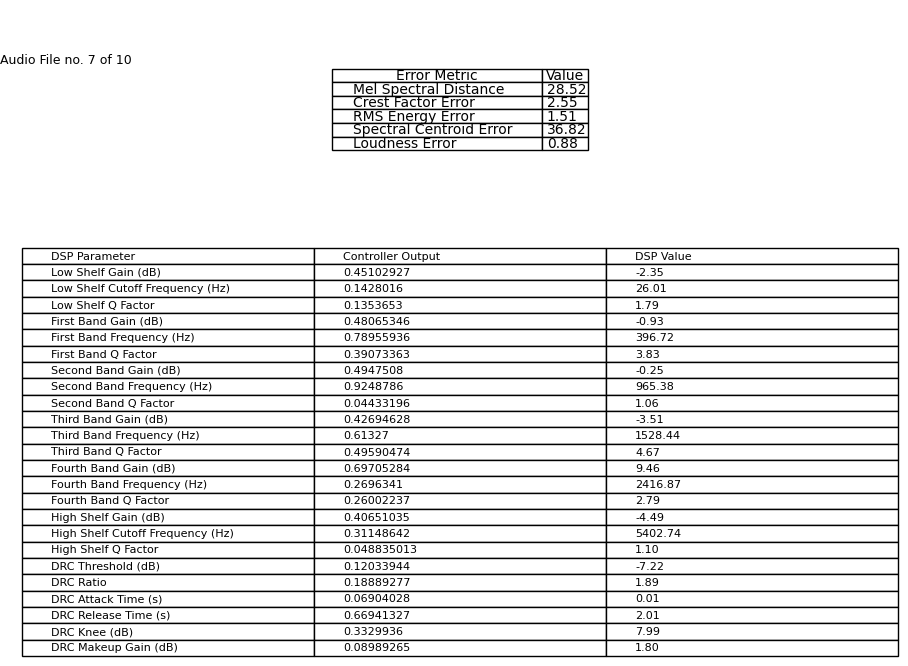

Audio File no. 7 of 10: Waveform and STFTs


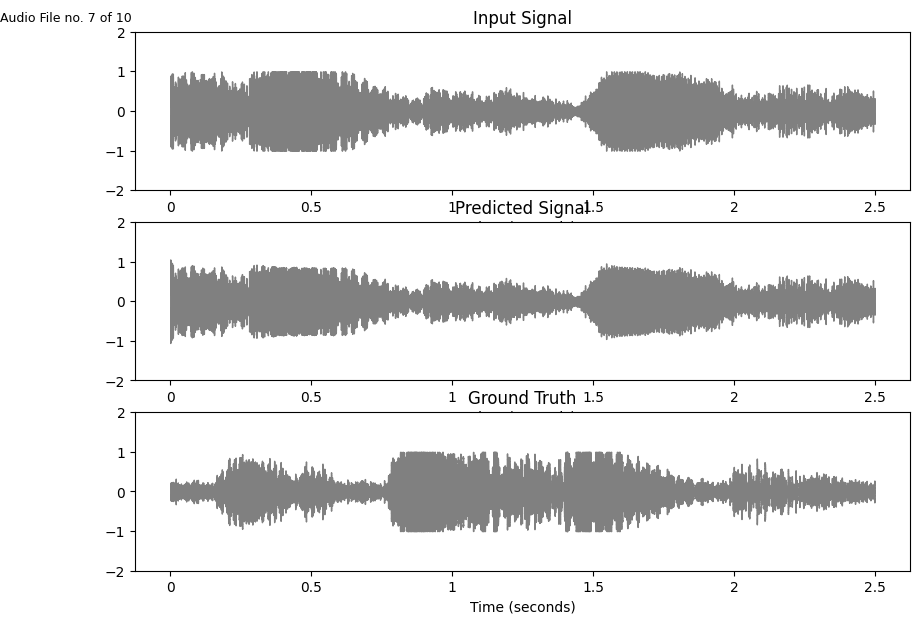

1/1 [==============================] - 0s 38ms/step
Audio File no. 8 of 10: Comparison Input, Prediction and Groundtruth


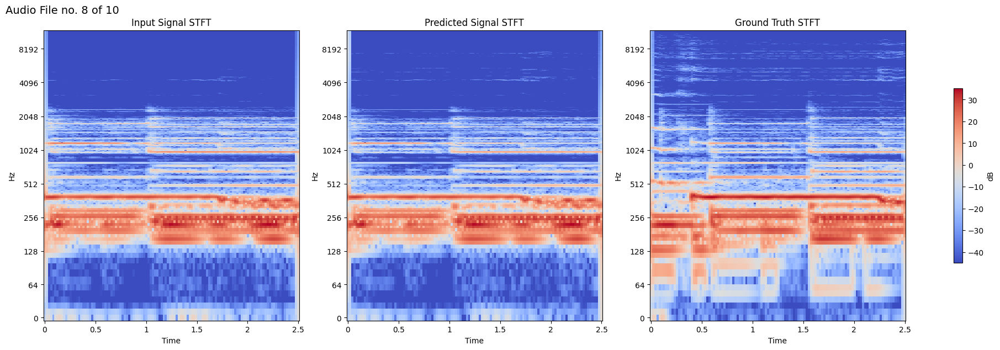

Audio File no. 8 of 10: Audio preview Input file, Prediction and Groundtruth


Audio File no. 8 of 10: Errormetrics and DSP Parameters


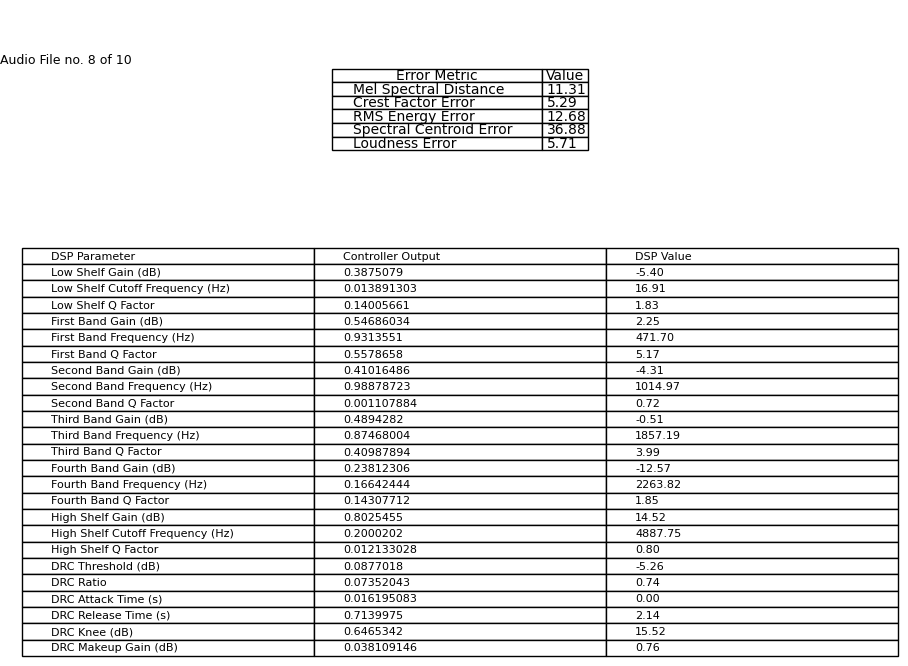

Audio File no. 8 of 10: Waveform and STFTs


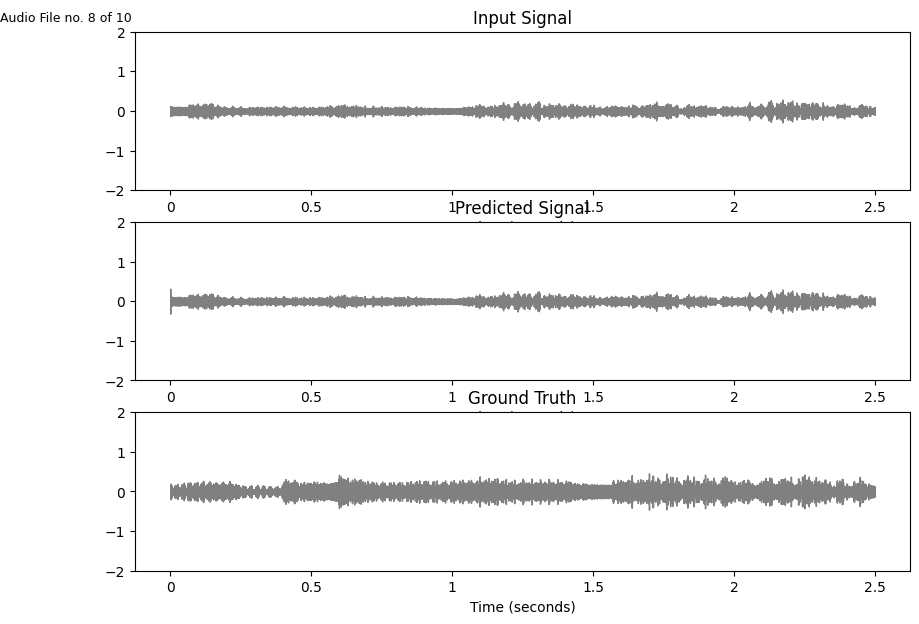

1/1 [==============================] - 0s 38ms/step
Audio File no. 9 of 10: Comparison Input, Prediction and Groundtruth


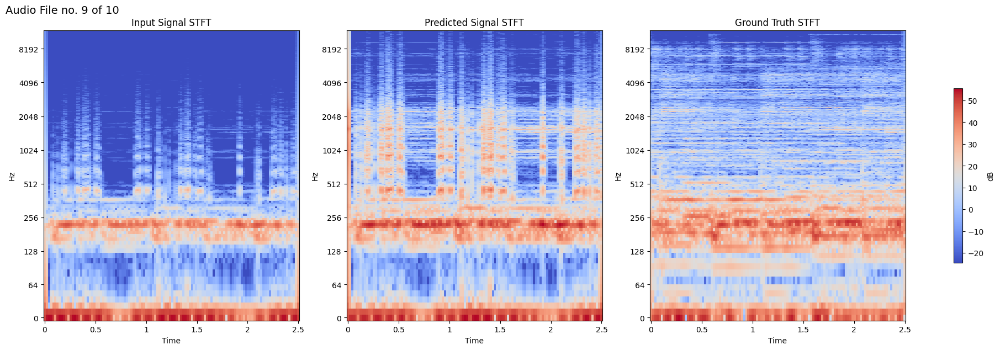

Audio File no. 9 of 10: Audio preview Input file, Prediction and Groundtruth


Audio File no. 9 of 10: Errormetrics and DSP Parameters


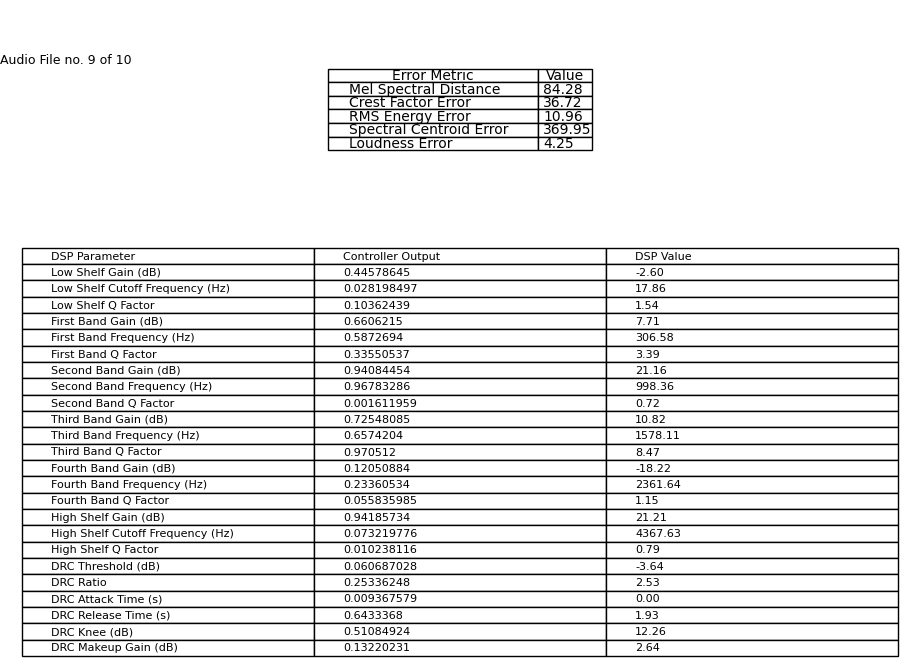

Audio File no. 9 of 10: Waveform and STFTs


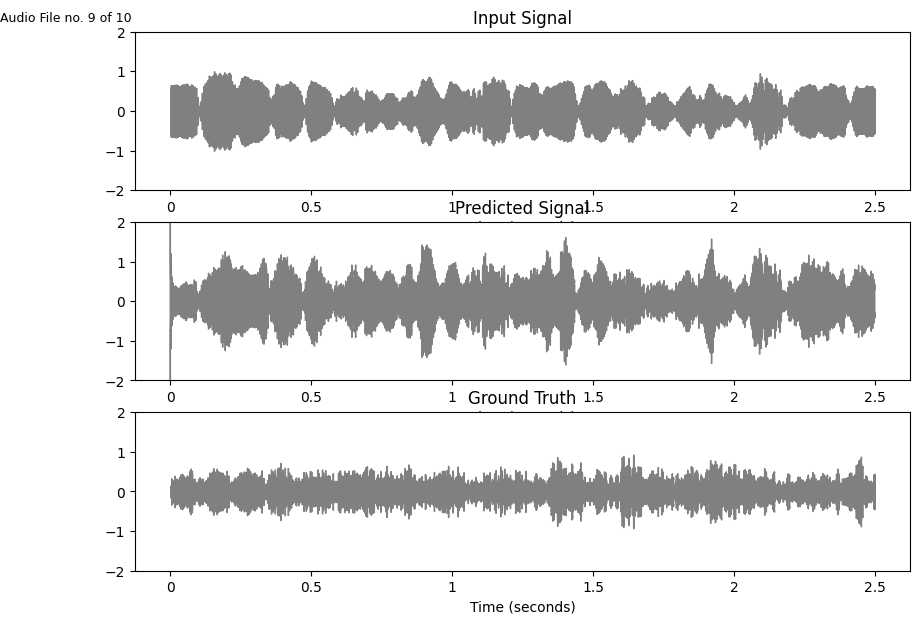

1/1 [==============================] - 0s 36ms/step
Audio File no. 10 of 10: Comparison Input, Prediction and Groundtruth


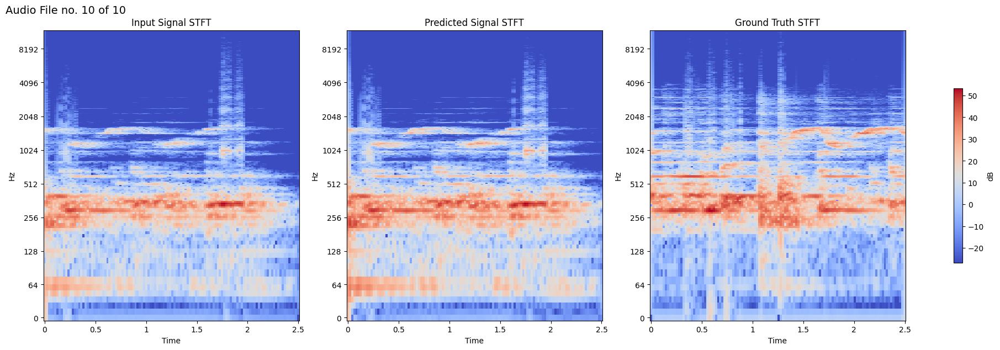

Audio File no. 10 of 10: Audio preview Input file, Prediction and Groundtruth


Audio File no. 10 of 10: Errormetrics and DSP Parameters


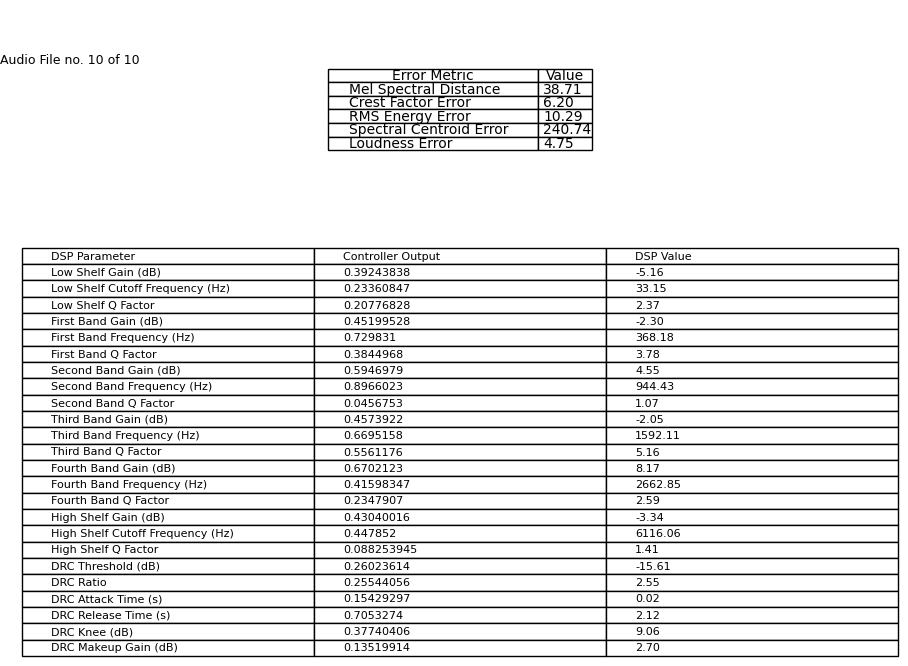

Audio File no. 10 of 10: Waveform and STFTs


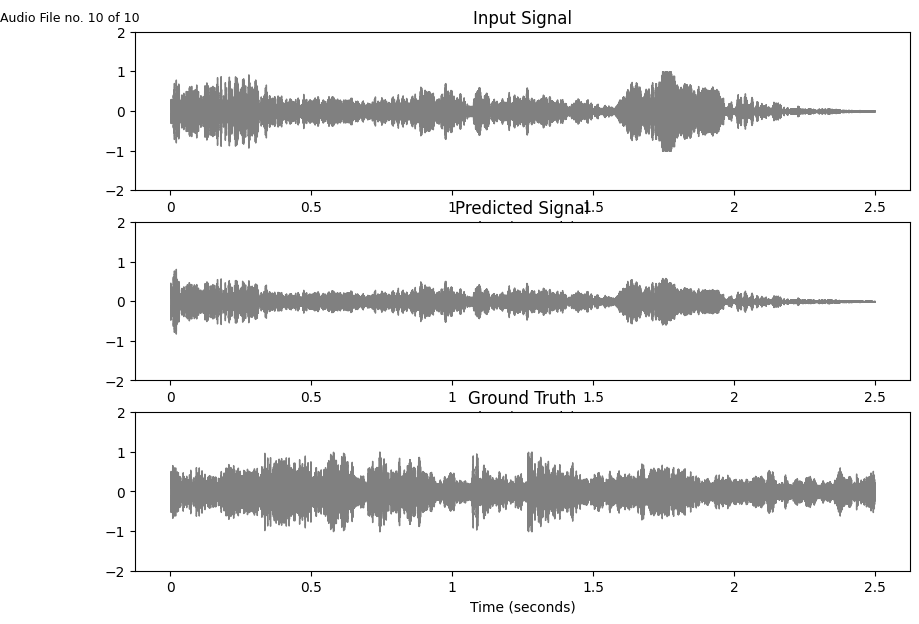

In [5]:
# Making predictions, evaluating metrics and control parameters, and showing STFTs, waveforms, and audio for example data
batch_no = 0
file_no = 0
# Iterate through the prepared test dataset
for i, ((x_batch, y_batch), y_true) in enumerate(test_dataset):
    '''if i < file_offset or (i - file_offset) % batch_size == 0:
        # Skip this iteration until the offset is reached or if it's a multiple of batch_size
        continue'''
    if i < file_offset:
        # Skip this iteration until the offset is reached
        continue
  


   # y_pred = model.predict((x_batch, y_batch))
   # dsp_arg = analyzer_model.predict((x_batch, y_batch))[0]
    y_pred = model.predict((x_batch, y_batch))
    dsp_arg = analyzer_model.predict((x_batch, y_batch))[0]
    
    peq_arg = dsp_arg[:18]  # This slices the first 18 elements from dsp_arg
    drc_arg = dsp_arg[18:24] 
    
    # Transform and retrieve DSP parameters for plotting
    dsp_transformed_diag = metrics.transform_dsp_parameters_for_diagram(dsp_arg)
    dsp_transformed = metrics.transform_dsp_parameters(dsp_arg)
    dsp_values_diag = metrics.get_dsp_parameter_for_diagram(dsp_arg)
    dsp_values = metrics.get_dsp_parameter(dsp_arg)

    # Apply peq_arg and drc_arg
    y_apply = apply_peq(x=x_batch[0], peq_arg=peq_arg)
    y_apply = apply_drc(x=y_apply, drc_arg=drc_arg)

    signal_apply = y_apply.numpy().flatten()  # Predicted signal
    signal_true = y_true.numpy().flatten()    # Ground truth signal

    print(f"Audio File no. {i+1} of {no_of_plots+file_offset}: Comparison Input, Prediction and Groundtruth")

   # For each batch, create a new figure and set of axes
    # Assuming you have the rest of your setup as before...
    fig_stft, axes_stft = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)  # Use constrained_layout for automatic adjustment
    
    # Assuming 'helpers.plot_stft_librosa' returns a ScalarMappable (like the one returned by plt.imshow)
    img1 = helpers.plot_stft_librosa(x_batch.numpy().flatten(), sample_rate, 'Input Signal STFT', axes_stft[0])
    

    # Create a single colorbar for all subplots
    sm = plt.cm.ScalarMappable(cmap=img1.cmap, norm=img1.norm)  # Extract colormap and normalization from the first image
    sm.set_array([])  # Set an empty array for the colorbar
    
    fig_stft.colorbar(sm, ax=axes_stft.ravel(), label='dB', location='right', shrink=0.6, pad=0.05)  # Create colorbar for all axes
    
    img2 = helpers.plot_stft_librosa(y_apply.numpy().flatten(), sample_rate, 'Predicted Signal STFT', axes_stft[1])
    
    img3 = helpers.plot_stft_librosa(y_true.numpy().flatten(), sample_rate, 'Ground Truth STFT', axes_stft[2])
    fig_stft.text(0.0, 1.0, f"Audio File no. {i+1} of {no_of_plots+file_offset}", 
              fontsize=14, va='bottom', ha='left', transform=fig_stft.transFigure)
    if plots_saving_on:
        plt.savefig(f'./plots/stfts_FileNo_{i+1}_SM.jpg', bbox_inches='tight')
    plt.show()

    print(f"Audio File no. {i+1} of {no_of_plots+file_offset}: Audio preview Input file, Prediction and Groundtruth")

    if audio_saving_on:
            x_batch_np = x_batch[0].numpy().astype('float32')
            y_apply_np = y_apply.numpy().astype('float32')
            y_true_np = y_true[0].numpy().astype('float32')
            sf.write(f'./plots/input_audio_FileNo_{i+1}_SM.wav', x_batch_np, sample_rate)
            sf.write(f'./plots/pred_audio_FileNo_{i+1}_SM.wav', y_apply_np, sample_rate)
            sf.write(f'./plots/ref_audio_FileNo_{i+1}_SM.wav', y_true_np, sample_rate)

    display(ipd.Audio(x_batch.numpy().flatten(), rate=sample_rate))
    display(ipd.Audio(y_apply.numpy().flatten(), rate=sample_rate))
    display(ipd.Audio(y_true.numpy().flatten(), rate=sample_rate))

    print(f"Audio File no. {i+1} of {no_of_plots+file_offset}: Errormetrics and DSP Parameters")

    
    errors = metrics.calculate_all_errors(y_apply, y_true[0], sample_rate)

    # Second Plot: Metrics and DSP Parameters Table, also made slimmer
    fig, axes = plt.subplots(2, 1, figsize=(9, 7))  # Adjusted height from 10 to 7
    # Plot Metrics as the first subplot
    metrics.plot_error_table(errors, axes[0])
   
    # Plot DSP Parameters Table as the second subplot
    metrics.plot_dsp_table(dsp_transformed_diag, dsp_values_diag, axes[1])
    plt.tight_layout()

    # Show the figure with all three waveforms
    fig.text(0.0, 1.0, f"Audio File no. {i+1} of {no_of_plots+file_offset}", 
              fontsize=9, va='bottom', ha='left', transform=fig_stft.transFigure)
    if plots_saving_on:
        plt.savefig(f'./plots/metricsAndParams_FileNo_{i+1}_SM.jpg', bbox_inches='tight')
    
    plt.show()

   
    
    print(f"Audio File no. {i+1} of {no_of_plots+file_offset}: Waveform and STFTs")
    
    fig, axes = plt.subplots(3, 1, figsize=(10, 7))

    # Plot the Input Signal waveform
    helpers.plot_waveform(x_batch[0].numpy().flatten(), sample_rate, 'Input Signal', axes[0])
    axes[0].set_title('Input Signal')
    
    # Plot the Predicted Signal waveform
    helpers.plot_waveform(y_pred[0].flatten(), sample_rate, 'Predicted Signal', axes[1])
    axes[1].set_title('Predicted Signal')
    
    # Plot the Ground Truth Signal waveform
    helpers.plot_waveform(y_true[0].numpy().flatten(), sample_rate, 'Ground Truth', axes[2])
    axes[2].set_title('Ground Truth')
    
    # Adjust layout, titles, etc. here
    
    # Show the figure with all three waveforms
    fig.text(0.0, 1.0, f"Audio File no. {i+1} of {no_of_plots+file_offset}", 
              fontsize=9, va='bottom', ha='left', transform=fig_stft.transFigure)
    if plots_saving_on:
        plt.savefig(f'./plots/waveforms_FileNo_{i+1}_SM.jpg', bbox_inches='tight')
    plt.show()
    if i >= no_of_plots+file_offset - 1:
            break  # Stop after the specified number of test files



1/1 [==============================] - 0s 40ms/step
Metrics Summary (Mean, Std Deviation, and 25th percentile):
Mel Spectral Distance: Mean = 38.08, Std Dev = 18.23, 50th Percentile = 17.43
Crest Factor Error: Mean = 9.94, Std Dev = 9.43, 50th Percentile = 1.27
RMS Energy Error: Mean = 6.27, Std Dev = 5.11, 50th Percentile = 1.04
Spectral Centroid Error: Mean = 202.43, Std Dev = 188.30, 50th Percentile = 27.29
Loudness Error: Mean = 2.63, Std Dev = 2.11, 50th Percentile = 0.38


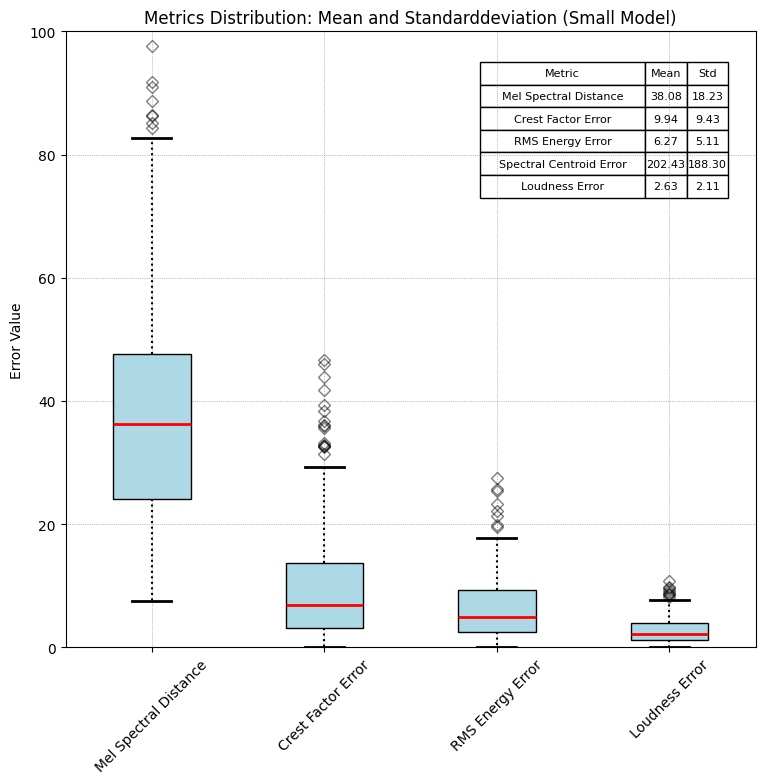

In [7]:
# Calculate and store accumulated metrics
accumulated_metrics = {}
processed_tracks = 0
no_of_tracks = 300
# Iterate through the prepared test dataset
for i, ((x_batch, y_batch), y_true) in enumerate(test_dataset):
    # Skip iterations based on offset and batch size
    if i < file_offset or (i - file_offset) % batch_size != 0:
        continue
    
    # Model predictions
    y_pred = model.predict((x_batch, y_batch))
    dsp_arg = analyzer_model.predict((x_batch, y_batch))[0]

    # DSP arguments slicing
    peq_arg = dsp_arg[:18]
    drc_arg = dsp_arg[18:24]

    # Apply DSP transformations
    y_apply = apply_peq(x=x_batch[0], peq_arg=peq_arg)
    y_apply = apply_drc(x=y_apply, drc_arg=drc_arg)


    # Error calculation
    errors = metrics.calculate_all_errors(y_apply, y_true[0], sample_rate)

    # Accumulate errors for each metric
    for metric, value in errors.items():
        if metric not in accumulated_metrics:
            accumulated_metrics[metric] = []
        accumulated_metrics[metric].append(value)
    
    processed_tracks += 1
    if processed_tracks >= no_of_tracks:
        break

# Calculate mean, standard deviation, and the 50th percentile for accumulated metrics
metrics_summary = {
    metric: {
        "mean": np.mean(values),
        "std": np.std(values),
        "50th percentile": np.percentile(values, 10)  # Calculate the 25th percentile (median)
    }
    for metric, values in accumulated_metrics.items()
}

# Display the summary including the 50th percentile
print("Metrics Summary (Mean, Std Deviation, and 25th percentile):")
for metric, summary in metrics_summary.items():
    print(f"{metric}: Mean = {summary['mean']:.2f}, Std Dev = {summary['std']:.2f}, 50th Percentile = {summary['50th percentile']:.2f}")

metrics.plot_boxplot_metrics(accumulated_metrics, plots_saving_on)
    

1/1 [==============================] - 0s 39ms/step


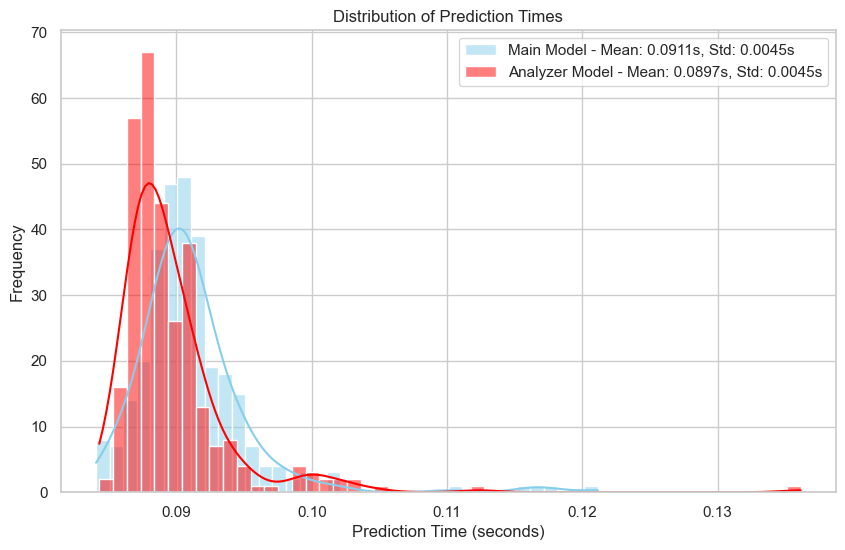

In [8]:
## timing
no_of_tracks = 300
# Initialize lists to store prediction times
prediction_times_main_model = []
prediction_times_analyzer_model = []

file_no = 0
accumulate_time_a =0 #analyser
accumulate_time_m =0 #model
for i, ((x_batch, y_batch), y_true) in enumerate(test_dataset):
    if i < file_offset:
        continue

    file_no += 1
    
    # Measure prediction time for the main model
    start_time = time.time()
    y_pred = model.predict((x_batch, y_batch))
    end_time = time.time()
    dif = end_time - start_time
    accumulate_time_m = accumulate_time_m+dif
    if dif > 0.125:
        prediction_times_main_model.append(accumulate_time_m / file_no)   
    else: 
        prediction_times_main_model.append(dif)

    # Measure prediction time for the analyzer model and applying dsp using controll parameters directly
    start_time = time.time()
    analyzer_pred = analyzer_model.predict((x_batch, y_batch))[0]
    peq_arg = analyzer_pred[:18]
    drc_arg = analyzer_pred[18:24]
    y_apply = apply_peq(x=x_batch[0], peq_arg=peq_arg)
    y_apply = apply_drc(x=y_apply, drc_arg=drc_arg)
    end_time = time.time()
    dif = end_time - start_time
    accumulate_time_a = accumulate_time_a+dif
    if dif > 0.2:
        prediction_times_main_model.append(accumulate_time_a / file_no)   
    else:
        prediction_times_analyzer_model.append(dif)


    if i >= no_of_tracks + file_offset - 1:
        break

# Calculate mean and standard deviation
mean_main_model = np.mean(prediction_times_main_model)
std_main_model = np.std(prediction_times_main_model)
mean_analyzer_model = np.mean(prediction_times_analyzer_model)
std_analyzer_model = np.std(prediction_times_analyzer_model)

# Plotting
sns.set(style='whitegrid')
plt.figure(figsize=(10, 6))

# Histogram for main model
sns.histplot(prediction_times_main_model, color="skyblue", label=f'Main Model - Mean: {mean_main_model:.4f}s, Std: {std_main_model:.4f}s', kde=True)

# Histogram for analyzer model
sns.histplot(prediction_times_analyzer_model, color="red", label=f'Analyzer Model - Mean: {mean_analyzer_model:.4f}s, Std: {std_analyzer_model:.4f}s', kde=True)

plt.xlabel('Prediction Time (seconds)')
plt.ylabel('Frequency')
plt.title('Distribution of Prediction Times')
plt.legend()

if plots_saving_on:
    plt.savefig(f'./plots/timings_SM.jpg', bbox_inches='tight')

plt.show()